<a href="https://colab.research.google.com/github/a7meeed23/final-/blob/main/final_project_text_to_image_generation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Install necessary libraries
!pip install transformers diffusers torch torchvision --quiet
!pip install datasets --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 23.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 471.6/471.6 kB 12.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 8.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 9.6 MB/s eta 0:00:00


In [ ]:
# ================================
# Setup and Environment
# ================================

# Import Libraries
import os
import json
import torch
import matplotlib.pyplot as plt
import re  # For regex operations
from PIL import Image
from transformers import CLIPProcessor
from diffusers import StableDiffusionPipeline
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset
import numpy as np

In [ ]:
!pip install kaggle


In [ ]:

from google.colab import files
files.upload()  # Upload kaggle.json file here


Saving kaggle33.json to kaggle33.json


{'kaggle33.json': b'{"username":"medoahmed23","key":"52e71ea71405e723a82b92ed2992dc54"}'}

In [ ]:
!mkdir -p ~/.kaggle
!cp /content/kaggle33.json ~/.kaggle/kaggle.json
!chmod 600 ~/.kaggle/kaggle.json


In [ ]:
!ls ~/.kaggle

kaggle.json


In [ ]:
!kaggle datasets list


ref                                                           title                                                size  lastUpdated          downloadCount  voteCount  usabilityRating  
------------------------------------------------------------  --------------------------------------------------  -----  -------------------  -------------  ---------  ---------------  
lainguyn123/student-performance-factors                       Student Performance Factors                          94KB  2024-09-02 10:53:57          26882        472  1.0              
abdulszz/spotify-most-streamed-songs                          Spotify Most Streamed Songs                          60KB  2024-09-07 18:23:14          10057        129  1.0              
valakhorasani/mobile-device-usage-and-user-behavior-dataset   Mobile Device Usage and User Behavior Dataset        11KB  2024-09-28 20:21:12           2933         64  1.0              
willianoliveiragibin/marvel-vs-dc                             Marvel v

In [ ]:
!ls ~/.kaggle/kaggle.json


/root/.kaggle/kaggle.json


In [ ]:
!cp /content/kaggle33.json ~/.kaggle/kaggle.json
!chmod 600 ~/.kaggle/kaggle.json


In [ ]:
!kaggle datasets download -d awsaf49/coco-2017-dataset

Dataset URL: https://www.kaggle.com/datasets/awsaf49/coco-2017-dataset
License(s): CC-BY-SA-4.0
100% 25.0G/25.0G [05:02<00:00, 129MB/s]
100% 25.0G/25.0G [05:02<00:00, 88.9MB/s]


In [ ]:
!unzip coco-2017-dataset.zip -d /content/coco2017


Streaming output truncated to the last 5000 lines.
  inflating: /content/coco2017/coco2017/val2017/000000000139.jpg  
  inflating: /content/coco2017/coco2017/val2017/000000000285.jpg  
  inflating: /content/coco2017/coco2017/val2017/000000000632.jpg  
  inflating: /content/coco2017/coco2017/val2017/000000000724.jpg  
  inflating: /content/coco2017/coco2017/val2017/000000000776.jpg  
  inflating: /content/coco2017/coco2017/val2017/000000000785.jpg  
  inflating: /content/coco2017/coco2017/val2017/000000000802.jpg  
  inflating: /content/coco2017/coco2017/val2017/000000000872.jpg  
  inflating: /content/coco2017/coco2017/val2017/000000000885.jpg  
  inflating: /content/coco2017/coco2017/val2017/000000001000.jpg  
  inflating: /content/coco2017/coco2017/val2017/000000001268.jpg  
  inflating: /content/coco2017/coco2017/val2017/000000001296.jpg  
  inflating: /content/coco2017/coco2017/val2017/000000001353.jpg  
  inflating: /content/coco2017/coco2017/val2017/000000001425.jpg  
  inflating

In [ ]:
# ================================
# Data Collection
# ================================
import os
import json

# Define paths for images and captions
image_path = '/content/coco2017/coco2017/train2017'
# Updated captions_file_path to include the correct file name
captions_file_path = '/content/coco2017/coco2017/annotations/captions_train2017.json'

# Load captions from the JSON file
with open(captions_file_path, 'r') as f:
    captions_data = json.load(f)

# Limit to a smaller sample size for efficiency
max_samples = 100  # Adjust based on available resources
images = []
captions = []

# Populate images and captions lists
for item in captions_data['annotations']:
    if len(images) >= max_samples:
        break
    image_id = str(item['image_id']).zfill(12)  # Ensure image ID matches file naming convention
    image_file = os.path.join(image_path, f"{image_id}.jpg")
    if os.path.exists(image_file):
        images.append(image_file)
        captions.append(item['caption'])

print(f"Loaded {len(images)} image-caption pairs.")

Loaded 100 image-caption pairs.


In [ ]:
# ================================
# Text Preprocessing
# ================================

def clean_caption(text):
    """
    Clean the caption by:
    - Lowercasing all characters.
    - Removing special characters.
    """
    text = text.lower()  # Convert to lowercase
    text = re.sub(r'[^a-z0-9\s]', '', text)  # Remove special characters
    return text

# Clean the captions
cleaned_captions = [clean_caption(caption) for caption in captions]

print("Sample captions after cleaning:")
for idx, caption in enumerate(cleaned_captions[:5], 1):
    print(f"{idx}: {caption}")

Sample captions after cleaning:
1: a bicycle replica with a clock as the front wheel
2: a room with blue walls and a white sink and door
3: a car that seems to be parked illegally behind a legally parked car
4: a large passenger airplane flying through the air
5: there is a gol plane taking off in a partly cloudy sky


In [ ]:
# Image Preprocessing
# ================================

# Define image transformation
image_transform = transforms.Compose([
    transforms.Resize((512, 512)),  # Resize to 512x512
    transforms.ToTensor(),  # Convert image to tensor
    transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize to [-1, 1]
])

def preprocess_image(image):
    """
    Preprocess the image by resizing and normalizing.

    Args:
        image (PIL Image or file path): The input image.

    Returns:
        torch.Tensor: The transformed image tensor.
    """
    if isinstance(image, str):  # If it's a file path
        image = Image.open(image).convert("RGB")
    return image_transform(image)

In [ ]:
# Model Development
# ================================

# Check for GPU availability
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}")

# Load the Stable Diffusion pipeline
try:
    pipe = StableDiffusionPipeline.from_pretrained(
        "runwayml/stable-diffusion-v1-5",
        torch_dtype=torch.float16 if device == "cuda" else torch.float32,
        # Removed 'revision' parameter to avoid errors
    )
    pipe = pipe.to(device)
    print("Stable Diffusion pipeline loaded successfully.")
except Exception as e:
    print(f"Error loading Stable Diffusion pipeline: {e}")

Using device: cuda


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

safety_checker/config.json:   0%|          | 0.00/4.72k [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


Stable Diffusion pipeline loaded successfully.


In [ ]:
# ================================
# Image Generation and Display
# ================================

def generate_and_display(captions, pipe, device):
    """
    Generates and displays images from a list of captions.

    Args:
        captions (list): List of text captions.
        pipe (StableDiffusionPipeline): The image generation pipeline.
        device (str): Device to run the pipeline on ('cuda' or 'cpu').
    """
    for caption in captions:
        try:
            # Generate image using the pipeline
            with torch.autocast(device) if device == "cuda" else torch.no_grad():
                image = pipe(caption).images[0]

            # Image Processing: Resize to 512x512 is already handled by the pipeline, but ensure consistency
            image = image.resize((512, 512))

            # Convert PIL image to numpy array and normalize to [0,1] for display
            image_np = np.array(image) / 255.0

            # Display the image
            plt.figure(figsize=(6, 6))
            plt.imshow(image_np)
            plt.axis("off")
            plt.title(caption)
            plt.show()

        except Exception as e:
            print(f"Error generating image for caption '{caption}': {e}")

# Generate and display images for the cleaned captions
generate_and_display(cleaned_captions, pipe, device)

  0%|          | 0/50 [00:00<?, ?it/s]

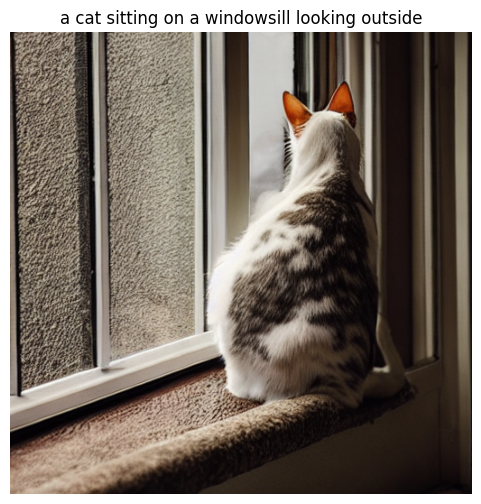

  0%|          | 0/50 [00:00<?, ?it/s]

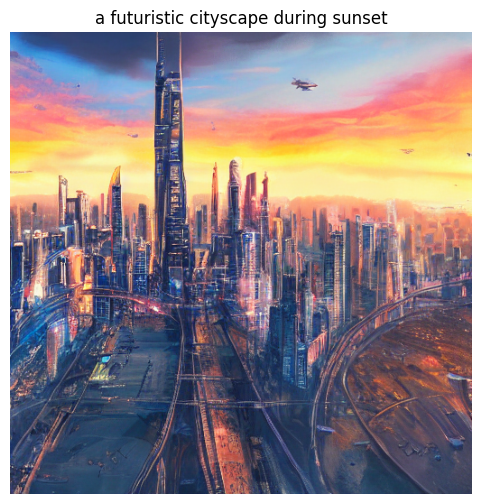

  0%|          | 0/50 [00:00<?, ?it/s]

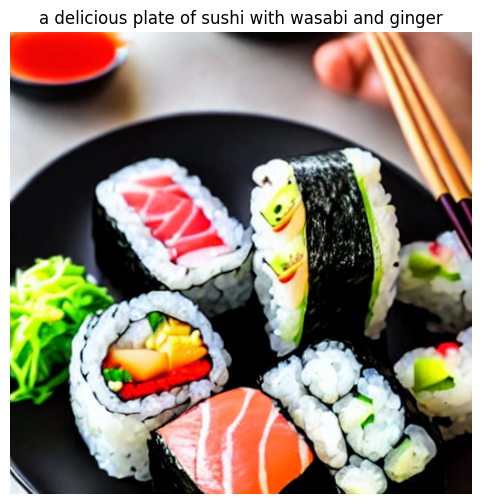

  0%|          | 0/50 [00:00<?, ?it/s]

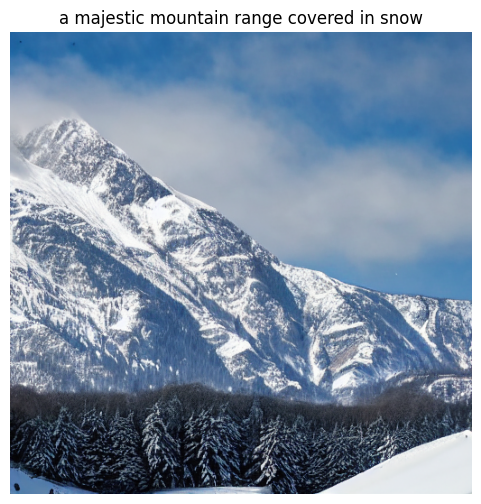

  0%|          | 0/50 [00:00<?, ?it/s]

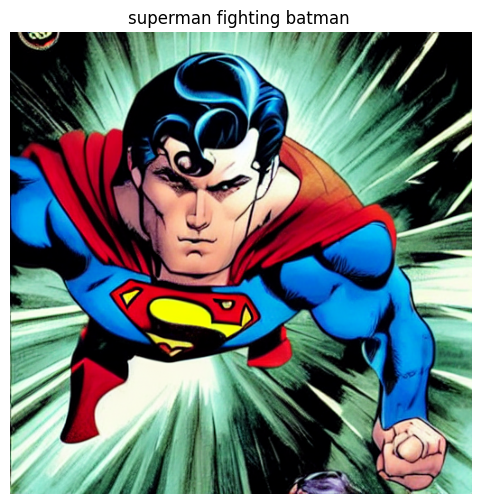

  0%|          | 0/50 [00:00<?, ?it/s]

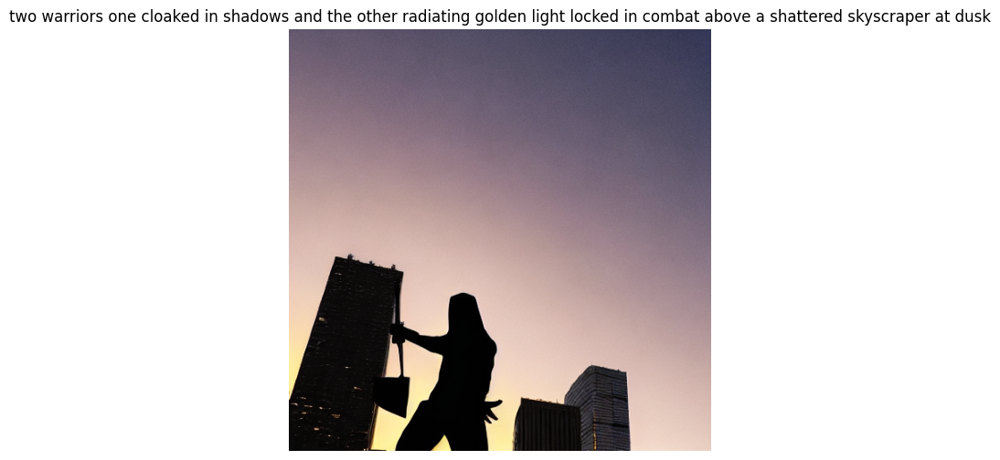

  0%|          | 0/50 [00:00<?, ?it/s]

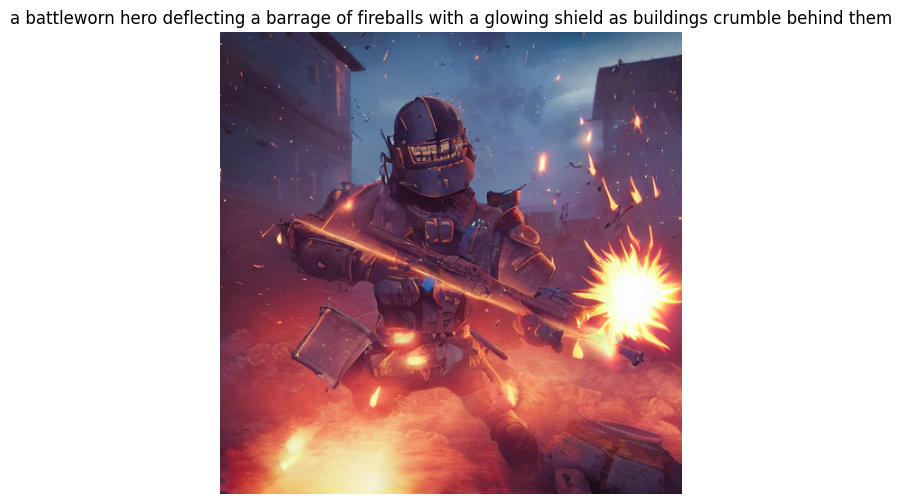

  0%|          | 0/50 [00:00<?, ?it/s]

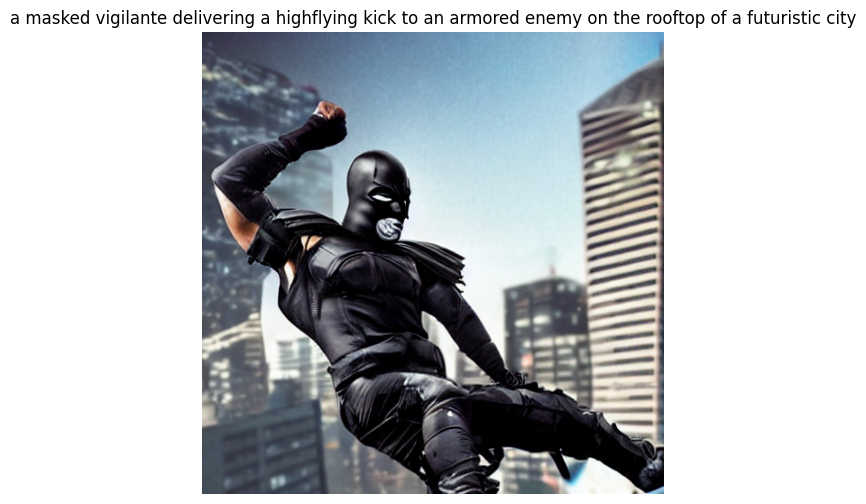

  0%|          | 0/50 [00:00<?, ?it/s]

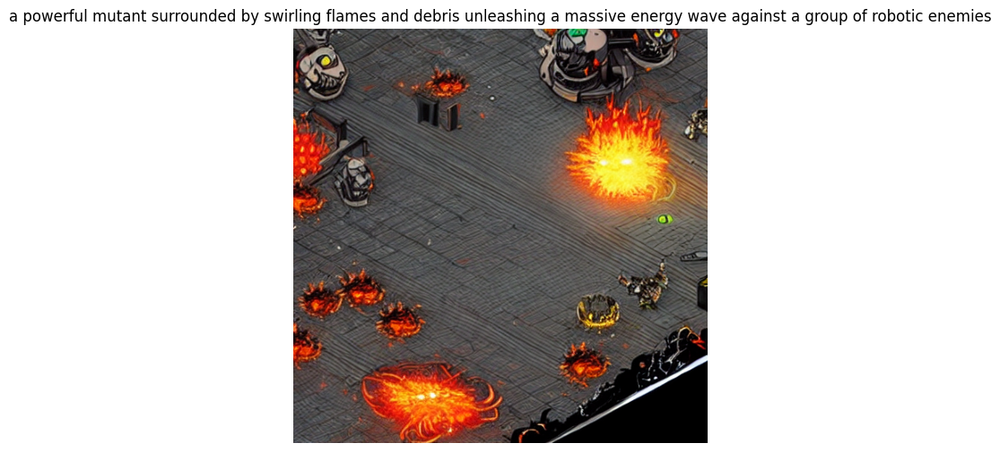

  0%|          | 0/50 [00:00<?, ?it/s]

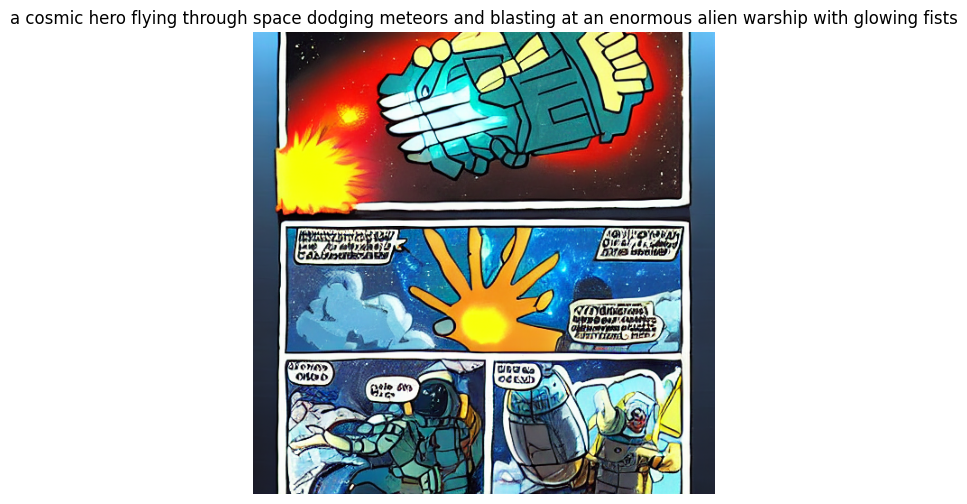

  0%|          | 0/50 [00:00<?, ?it/s]

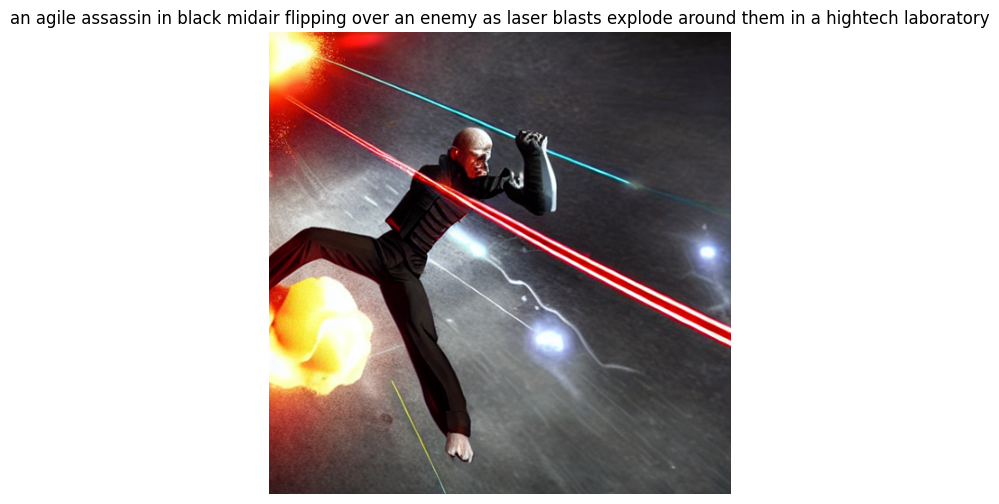

  0%|          | 0/50 [00:00<?, ?it/s]

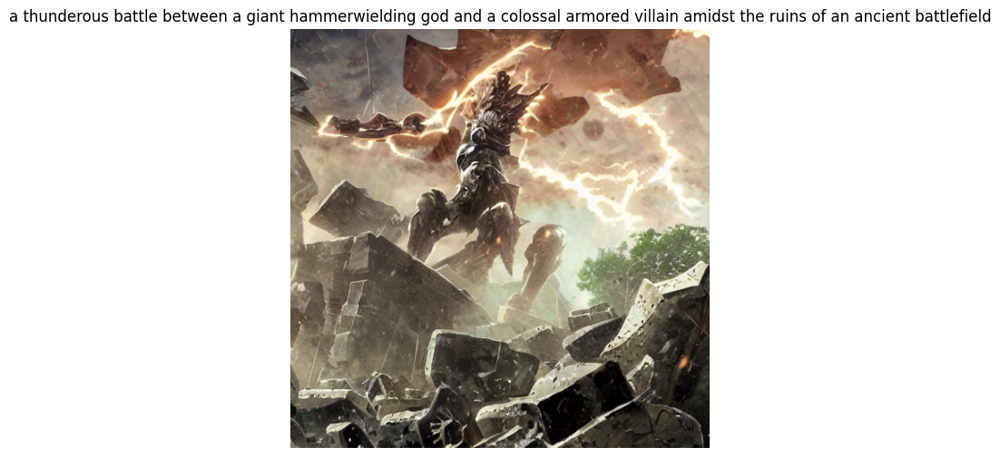

  0%|          | 0/50 [00:00<?, ?it/s]

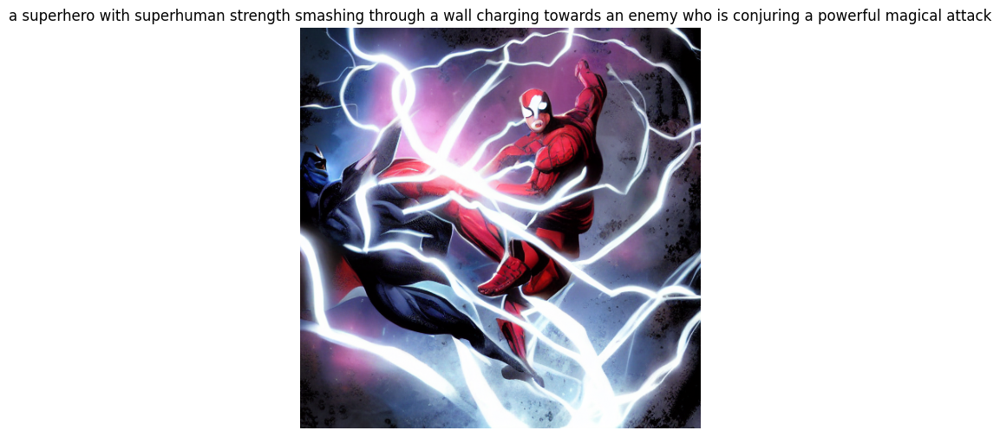

  0%|          | 0/50 [00:00<?, ?it/s]

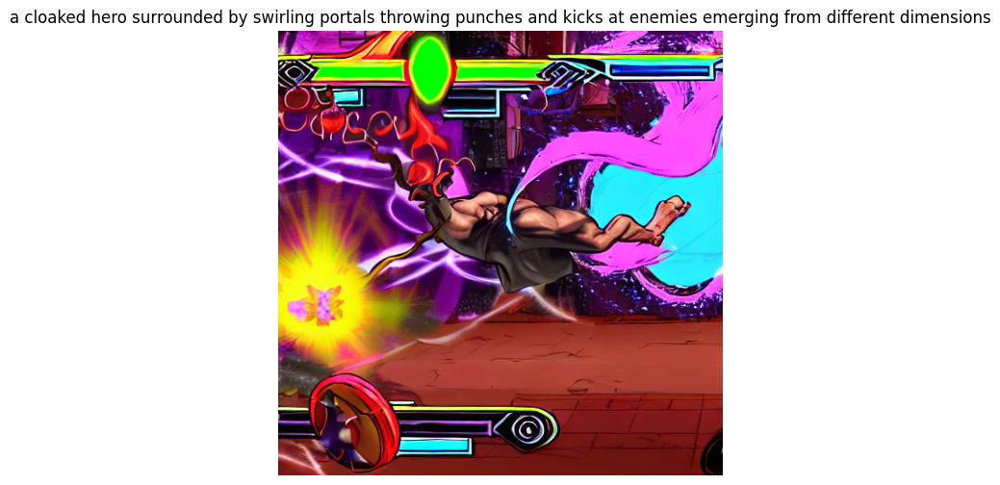

  0%|          | 0/50 [00:00<?, ?it/s]

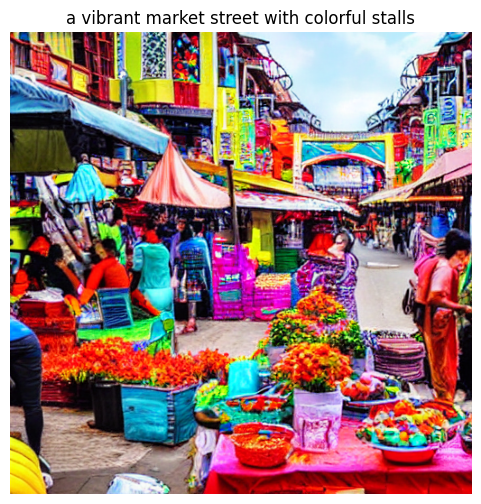

In [ ]:
# Optional: Define and Use Sample Captions
# ================================

# Predefined sample captions
sample_captions = [
    "A cat sitting on a windowsill looking outside.",
    "A futuristic cityscape during sunset.",
    "A delicious plate of sushi with wasabi and ginger.",
    "A majestic mountain range covered in snow.",
     "superman fighting batman .",
    "Two warriors, one cloaked in shadows and the other radiating golden light, locked in combat above a shattered skyscraper at dusk.",

"A battle-worn hero deflecting a barrage of fireballs with a glowing shield, as buildings crumble behind them.",

"A masked vigilante delivering a high-flying kick to an armored enemy on the rooftop of a futuristic city.",

"A powerful mutant, surrounded by swirling flames and debris, unleashing a massive energy wave against a group of robotic enemies.",

"A cosmic hero flying through space, dodging meteors and blasting at an enormous alien warship with glowing fists.",

"An agile assassin in black, mid-air flipping over an enemy, as laser blasts explode around them in a high-tech laboratory.",

"A thunderous battle between a giant, hammer-wielding god and a colossal armored villain amidst the ruins of an ancient battlefield.",

"A superhero with superhuman strength smashing through a wall, charging towards an enemy who is conjuring a powerful magical attack.",

"A cloaked hero, surrounded by swirling portals, throwing punches and kicks at enemies emerging from different dimensions.",
    "A vibrant market street with colorful stalls."
]

# Clean the sample captions
cleaned_sample_captions = [clean_caption(caption) for caption in sample_captions]

# Generate and display images for the predefined sample captions
generate_and_display(cleaned_sample_captions, pipe, device)

In [ ]:
!pip install transformers diffusers torch torchvision ipywidgets --quiet


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 35.9 MB/s eta 0:00:00


In [ ]:
# Setup and Environment
# ================================

# Import Libraries
import os
import json
import torch
import matplotlib.pyplot as plt
import re  # For regex operations
from PIL import Image
from transformers import CLIPProcessor
from diffusers import StableDiffusionPipeline
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset
import numpy as np  # For array operations
import ipywidgets as widgets
from IPython.display import display, clear_output

# ================================
# Model Development
# ================================

# Check for GPU availability
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}")

# Load the Stable Diffusion pipeline with a potentially higher quality model
try:
    pipe = StableDiffusionPipeline.from_pretrained(
        "stabilityai/stable-diffusion-2-1",  # Using a higher-quality model
        torch_dtype=torch.float16 if device == "cuda" else torch.float32,
        # use_auth_token=True  # Uncomment and set to True if using a private model
    )
    pipe = pipe.to(device)
    print("Stable Diffusion pipeline loaded successfully.")
except Exception as e:
    print(f"Error loading Stable Diffusion pipeline: {e}")

# ================================
# GUI Implementation
# ================================

# Define the sample captions (Marvel-style fighting descriptions)
sample_captions = [
    "A fearless superhero clashing with a powerful villain in the middle of a burning city, energy beams and lightning crackling around them.",
    "Two warriors, one cloaked in shadows and the other radiating golden light, locked in combat above a shattered skyscraper at dusk.",
    "A battle-worn hero deflecting a barrage of fireballs with a glowing shield, as buildings crumble behind them.",
    "A masked vigilante delivering a high-flying kick to an armored enemy on the rooftop of a futuristic city.",
    "A powerful mutant, surrounded by swirling flames and debris, unleashing a massive energy wave against a group of robotic enemies.",
    "A cosmic hero flying through space, dodging meteors and blasting at an enormous alien warship with glowing fists.",
    "An agile assassin in black, mid-air flipping over an enemy, as laser blasts explode around them in a high-tech laboratory.",
    "A thunderous battle between a giant, hammer-wielding god and a colossal armored villain amidst the ruins of an ancient battlefield.",
    "A superhero with superhuman strength smashing through a wall, charging towards an enemy who is conjuring a powerful magical attack.",
    "A cloaked hero, surrounded by swirling portals, throwing punches and kicks at enemies emerging from different dimensions.",
    "A mighty avenger wielding dual energy swords, battling robotic drones in a neon-lit alleyway.",
    "A sorceress unleashing dark magic spells while engaging in a fierce duel with a cybernetic knight.",
    "A stealthy ninja using smoke bombs and swift strikes to take down a group of armed mercenaries in a moonlit forest.",
    "A high-tech mech pilot controlling a giant robot to defend the city from an alien invasion.",
    "A warrior princess riding a dragon into battle against a horde of undead soldiers."
]

# Create Text Input Widget
caption_input = widgets.Text(
    value='',
    placeholder='Enter your caption here...',
    description='Caption:',
    disabled=False,
    layout=widgets.Layout(width='80%')
)

# Create Button Widget
generate_button = widgets.Button(
    description='Generate Image',
    disabled=False,
    button_style='success',  # 'success', 'info', 'warning', 'danger' or ''
    tooltip='Click to generate image',
    icon='paint-brush'  # (FontAwesome names without the 'fa-' prefix)
)

# Create Dropdown for Sample Captions
sample_dropdown = widgets.Dropdown(
    options=['Select a Sample Caption'] + [f"{i+1}: {caption[:50]}..." for i, caption in enumerate(sample_captions)],
    value='Select a Sample Caption',
    description='Samples:',
    disabled=False,
    layout=widgets.Layout(width='80%')
)

# Create Output Widget
output = widgets.Output()

# Define the function to handle button click
def on_generate_button_clicked(b):
    with output:
        clear_output(wait=True)
        user_caption = caption_input.value.strip()
        if not user_caption:
            # If no input provided, use the selected sample caption
            selected_index = sample_dropdown.index
            if selected_index == 0:
                print("Please enter a caption or select a sample caption.")
                return
            else:
                user_caption = sample_captions[selected_index - 1]
        print(f"Generating image for caption:\n{user_caption}\n")

        # Preprocess user caption to enhance quality
        user_caption = preprocess_caption(user_caption)

        try:
            # Generate image using the pipeline with adjusted parameters
            with torch.autocast(device) if device == "cuda" else torch.no_grad():
                image = pipe(user_caption, num_inference_steps=50, guidance_scale=7.5).images[0]  # Increased steps and scale for quality

            # Image Processing: Resize to 512x512 is already handled by the pipeline, but ensure consistency
            image = image.resize((512, 512))

            # Convert PIL image to numpy array and normalize to [0,1] for display
            image_np = np.array(image) / 255.0

            # Display the image
            plt.figure(figsize=(6, 6))
            plt.imshow(image_np)
            plt.axis("off")
            plt.title(user_caption)
            plt.show()
        except Exception as e:
            print(f"Error generating image: {e}")

# Preprocess the caption to enhance quality
def preprocess_caption(caption):
    # Remove any unnecessary characters and ensure it follows a similar style to samples
    caption = re.sub(r'[^a-zA-Z0-9\s,]', '', caption)  # Remove special characters
    caption = ' '.join(caption.split())  # Normalize whitespace
    if len(caption.split()) < 5:  # Ensure a minimum number of words for better generation
        caption = "A dynamic scene featuring " + caption
    return caption

# Attach the function to the button's click event
generate_button.on_click(on_generate_button_clicked)

# Define the function to handle dropdown change
def on_sample_dropdown_change(change):
    if change['new'] != 'Select a Sample Caption':
        # Automatically populate the text input with the selected sample caption
        selected_index = sample_dropdown.index - 1  # Adjust for dropdown offset
        if 0 <= selected_index < len(sample_captions):
            caption_input.value = sample_captions[selected_index]

# Attach the function to the dropdown's value change event
sample_dropdown.observe(on_sample_dropdown_change, names='value')

# Display the widgets
display(widgets.VBox([
    widgets.HBox([caption_input, generate_button]),
    sample_dropdown,
    output
]))


Using device: cuda


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/537 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

model.safetensors:   0%|          | 0.00/1.36G [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/633 [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/345 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/824 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/939 [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/611 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.46G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


Stable Diffusion pipeline loaded successfully.


In [ ]:
!pip install diffusers --upgrade

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 13.2 MB/s eta 0:00:00


In [ ]:
# ================================
# Setup and Environment
# ================================

# Install necessary libraries (if needed)
# !pip install transformers diffusers torch torchvision ipywidgets --quiet

# Import Libraries
import os
import json
import torch
import matplotlib.pyplot as plt
import re
from PIL import Image
from transformers import CLIPProcessor
from diffusers import StableDiffusionPipeline
import torchvision.transforms as transforms
import numpy as np
import ipywidgets as widgets
from IPython.display import display, clear_output

# ================================
# GPU Check & Pipeline Setup
# ================================

device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}")

# Load Stable Diffusion model with attention mechanisms
try:
    pipe = StableDiffusionPipeline.from_pretrained(
        "stabilityai/stable-diffusion-2-1",
        torch_dtype=torch.float16 if device == "cuda" else torch.float32,
    )
    pipe = pipe.to(device)
    print("Stable Diffusion pipeline with attention loaded successfully.")
except Exception as e:
    print(f"Error loading the pipeline: {e}")

# ================================
# GUI Implementation
# ================================

# Define sample captions
sample_captions = [
    "A fearless superhero clashing with a powerful villain in the middle of a burning city.",
    "A cosmic hero flying through space, dodging meteors.",
    "A futuristic cityscape during sunset.",
    "A superhero with superhuman strength smashing through a wall.",
    "A warrior princess riding a dragon into battle."
    "A player scoring a goal in last minute.",
    "A battle-worn hero deflecting a barrage of fireballs.",
]

# Text Input Widget
caption_input = widgets.Text(
    value='',
    placeholder='Enter your caption here...',
    description='Caption:',
    layout=widgets.Layout(width='80%')
)

# Button Widget
generate_button = widgets.Button(
    description='Generate Image',
    button_style='success',
    tooltip='Click to generate image',
    icon='paint-brush'
)

# Dropdown for sample captions
sample_dropdown = widgets.Dropdown(
    options=['Select a Sample Caption'] + [f"{i+1}: {caption[:50]}..." for i, caption in enumerate(sample_captions)],
    value='Select a Sample Caption',
    description='Samples:',
    layout=widgets.Layout(width='80%')
)

# Output Widget for displaying images
output = widgets.Output()

# Define the image generation function
def on_generate_button_clicked(b):
    with output:
        clear_output(wait=True)
        user_caption = caption_input.value.strip()
        if not user_caption:
            # Use the selected sample caption if no input is provided
            selected_index = sample_dropdown.index
            if selected_index == 0:
                print("Please enter a caption or select a sample caption.")
                return
            else:
                user_caption = sample_captions[selected_index - 1]

        print(f"Generating image for caption:\n{user_caption}\n")
        try:
            # Generate image using the pipeline with cross-attention
            with torch.autocast(device) if device == "cuda" else torch.no_grad():
                image = pipe(user_caption).images[0]

            # Image Processing: Resize to 512x512
            image = image.resize((512, 512))
            image_np = np.array(image) / 255.0  # Normalize for display

            # Display the generated image
            plt.figure(figsize=(6, 6))
            plt.imshow(image_np)
            plt.axis("off")
            plt.title(user_caption)
            plt.show()
        except Exception as e:
            print(f"Error generating image: {e}")

# Attach the generate function to the button click
generate_button.on_click(on_generate_button_clicked)

# Handle sample caption selection
def on_sample_dropdown_change(change):
    if change['new'] != 'Select a Sample Caption':
        selected_index = sample_dropdown.index - 1
        if 0 <= selected_index < len(sample_captions):
            caption_input.value = sample_captions[selected_index]

sample_dropdown.observe(on_sample_dropdown_change, names='value')

# Display the GUI elements
display(widgets.VBox([widgets.HBox([caption_input, generate_button]), sample_dropdown, output]))

Using device: cuda


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/537 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

text_encoder/config.json:   0%|          | 0.00/633 [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/345 [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.36G [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/824 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.46G [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/611 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/939 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


Stable Diffusion pipeline with attention loaded successfully.
